## Pre-processing Approaches

#### AZ

In [166]:
pd.reset_option('max_colwidth')
df.sample(20)

,Talk_ID,public_url,headline,description,event,duration,published,views,text,speaker_1,...,speaker2_profile,speaker_3,speaker3_occupation,speaker3_introduction,speaker3_profile,speaker_4,speaker4_occupation,speaker4_introduction,speaker4_profile,tag
3429,1308,https://www.ted.com/talks/antonio_damasio_the_...,The quest to understand consciousness,Every morning we wake up and regain consciousn...,TED2011,0:18:42,12/19/11,1830696,I'm here to talk about the wonder and the my...,Antonio Damasio,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,decision-making
5376,2459,https://www.ted.com/talks/meron_gribetz_a_glim...,A glimpse of the future through an augmented r...,What if technology could connect us more deepl...,TED2016,0:10:54,3/18/16,1676056,Today's computers are so amazing that we fai...,Meron Gribetz,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,prediction
211,97,https://www.ted.com/talks/dan_gilbert_asks_why...,The surprising science of happiness,"Dan Gilbert, author of ""Stumbling on Happiness...",TED2004,0:21:16,9/26/06,15685502,"When you have 21 minutes to speak, two milli...",Dan Gilbert,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,happiness
3482,1379,https://www.ted.com/talks/andrew_stanton_the_c...,The clues to a great story,"Filmmaker Andrew Stanton (""Toy Story,"" ""WALL-E...",TED2012,0:19:16,3/6/12,3030719,A tourist is backpacking through the highlan...,Andrew Stanton,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,animation
9826,1795,https://www.ted.com/talks/paul_kemp_robertson_...,Bitcoin. Sweat. Tide. Meet the future of brand...,Currency -- the bills and coins you carry in y...,TEDGlobal 2013,0:10:51,7/25/13,1202325,So if I was to ask you what the connection b...,Paul Kemp-Robertson,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,marketing
6499,2804,https://www.ted.com/talks/richard_browning_how...,How I built a jet suit,We've all dreamed of flying -- but for Richard...,TED2017,0:07:08,6/13/17,1770841,"Michael Browning: engineer, innovator — inve...",Richard Browning,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,future
10436,2164,https://www.ted.com/talks/fredy_peccerelli_a_f...,A forensic anthropologist who brings closure f...,"In Guatemala's 36-year conflict, 200,000 civil...",TEDYouth 2014,0:08:40,1/8/15,741630,Guatemala is recovering from a 36-year armed...,Fredy Peccerelli,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,forensics
8540,1195,https://www.ted.com/talks/a_robot_that_flies_l...,A robot that flies like a bird,Plenty of robots can fly -- but none can fly l...,TEDGlobal 2011,0:06:19,7/22/11,6392096,It is a dream of mankind to fly like a bird....,Markus Fischer,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,technology
11067,2412,https://www.ted.com/talks/jill_farrant_how_we_...,How we can make crops survive without water,As the world's population grows and the effect...,TEDGlobal>Geneva,0:13:56,1/19/16,1428187,I believe that the secret to producing extre...,Jill Farrant,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,garden
9531,1580,https://www.ted.com/talks/eddie_obeng_smart_fa...,Smart failure for a fast-changing world,The world is changing much more rapidly than m...,TEDGlobal 2012,0:12:37,10/15/12,1537618,"Over the past six months, I've spent my time...",Eddie Obeng,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,success


In [167]:
# AZ
# Apply a first round of text cleaning techniques
def clean_text_round1(text):
    '''Make text lowercase, remove text in parentheses, remove punctuation and remove words containing numbers.'''
    text = text.lower()
    text = re.sub('\[.*?\]', '', text)
    #Jay's attempts to remove everything w/ parentheses
#    text = re.sub('\(.*?\)', '', text)
    text = re.sub('\([^)]*\)', '', text)
#    text = re.sub(r'\([^()]*\)', '', text)
    
    text = re.sub('[%s]' % re.escape(string.punctuation), '', text)
    text = re.sub('\w*\d\w*', '', text)
    return text

round1 = lambda x: clean_text_round1(x)

In [168]:
# Let's take a look at the updated text
data_clean = pd.DataFrame(df.text.apply(round1))

In [171]:
pd.set_option('max_colwidth',1000)
data_clean.sample(100)

,text
11084,welcome to bayeku a riverine community in ikorodu lagos — a vivid representation of several riverine communities across nigeria communities whose waterways have been infested by an invasive aquatic weed communities where economic livelihoods have been hampered fishing marine transportation and trading communities where fish yields have diminished communities where schoolchildren are unable to go to school for days sometimes weeks on end who would have thought that this plant with round leaves inflated stems and showy lavender flowers would cause such havoc in these communities the plant is known as water hyacinth and its botanical name eichhornia crassipes interestingly in nigeria the plant is also known by other names names associated with historical events as well as myths in some places the plant is called babangida when you hear babangida you remember the military and military coups and you think fear restraint in parts of nigeria in the niger delta the plant is also known...
9965,iran is israels best friend and we do not intend to change our position in relation to tehran believe it or not this is a quote from an israeli prime minister but its not bengurion or golda meir from the era of the shah its actually from yitzhak rabin the year is ayatollah khomeini is still alive and much like ahmadinejad today hes using the worst rhetoric against israel yet rabin referred to iran as a geostrategic friend today when we hear the threats of war and the high rhetoric were oftentimes led to believe that this is yet another one of those unsolvable middle eastern conflicts with roots as old as the region itself nothing could be further from the truth and i hope today to show you why that is the relations between the iranian and the jewish people throughout history has actually been quite positive starting in bc when king cyrus the great of persia liberated the jewish people from their babylonian captivity a third of the jewish population stayed in babylonia ...
1566,so people argue vigorously about the definition of life they ask if it should have reproduction in it or metabolism or evolution and i dont know the answer to that so im not going to tell you i will say that life involves computation so this is a computer program booted up in a cell the program would execute and it could result in this person or with a small change it could result in this person or another small change this person or with a larger change this dog or this tree or this whale so now if you take this metaphor of genome as program seriously you have to consider that chris anderson is a computerfabricated artifact as is jim watson craig venter as are all of us and in convincing yourself that this metaphor is true there are lots of similarities between genetic programs and computer programs that could help to convince you but one to me thats most compelling is the peculiar sensitivity to small changes that can make large changes in biological development — the output...
12857,my name is mwende katwiwa and i am a poet a panafricanist and a freedom fighter i was years old when i first heard about reproductive justice i was working at women with a vision where i learned that reproductive justice was defined by sister song as one a womans right to decide if and when she will have a baby and the conditions under which she will give birth two a womans right to decide if she will not have a baby and her options for preventing or ending a pregnancy and three a womans right to parent the children she already has in safe and healthy environments without fear of violence from individuals or the government ive always wanted to be a mother growing up i heard all about the joys of motherhood i used to dream of watching my womb weave wonder into this world see i knew i was young but i figured it couldnt hurt to start planning for something so big so early but now im years old and i dont know if i have what it takes to stomach motherhood ...
12893,on a beautiful day j

In [35]:
# Apply a second round of cleaning
def clean_text_round2(text):
    '''Get rid of some additional punctuation and non-sensical text that was missed the first time around.'''
    text = re.sub('[‘’“”—…]', '', text)
    text = re.sub('\n', '', text)
    return text

round2 = lambda x: clean_text_round2(x)

In [36]:
# Let's take a look at the updated text
data_clean = pd.DataFrame(data_clean.text.apply(round2))

In [37]:
pd.set_option('max_colwidth',800)
data_clean.sample(20)

,text
163,hi im going to ask you to raise your arms and wave back just the way i am kind of a royal wave you can mimic what you can see you can program the hundreds of muscles in your arm soon youll be able to look inside your brain and program control the hundreds of brain areas that you see there im going to tell you about that technology people have wanted to look inside the human mind the human brain for thousands of years well coming out of the research labs just now for our generation is the possibility to do that people envision this as being very difficult you had to take a spaceship shrink it down inject it into the bloodstream it was terribly dangerous you could be attacked by white blood cells in the arteries but now we have a real technology to do this were going to fly int...
128,you know im struck by how one of the implicit themes of ted is compassion these very moving demonstrations weve just seen hiv in africa president clinton last night and id like to do a little collateral thinking if you will about compassion and bring it from the global level to the personal im a psychologist but rest assured i will not bring it to the scrotal there was a very important study done a while ago at princeton theological seminary that speaks to why it is that when all of us have so many opportunities to help we do sometimes and we dont other times a group of divinity students at the princeton theological seminary were told that they were going to give a practice sermon and they were each given a sermon topic half of those students were given as a topic the parable ...
1533,this back here was my brain cancer isnt it nice the key phrase is was phew having brain cancer was really as you can imagine shocking news for me i knew nothing about cancer in western cultures when you have cancer its as if you disappear in a way your life as a complex human being is replaced by medical data your images your exams your lab values a list of medicines and everyone changes as well you suddenly become a disease on legs doctors start speaking a language which you dont understand they start pointing their fingers at your body and your images people start changing as well because they start dealing with the disease instead of with the human being they say what did the doctor say before even saying hello and in the meanwhile youre left with questions to which nobody...
831,today i wanted to well this morning i want to talk about the future of humandriven transportation about how we can cut congestion pollution and parking by getting more people into fewer cars and how we can do it with the technology thats in our pockets and yes im talking about smartphones not selfdriving cars but to get started weve got to go back over years because it turns out there was an uber way before uber and if it had survived the future of transportation would probably already be here so let me introduce you to the jitney in it was created or invented by a guy named lp draper he was a car salesman from la and he had an idea well he was cruising around downtown los angeles my hometown and he saw trolleys with long lines of people trying to get to where they wanted ...
692,so a few years ago i was at jfk airport about to get on a flight when i was approached by two women who i do not think would be insulted to hear themselves described as tiny old toughtalking italianamerican broads the taller one who is like up here she comes marching up to me and she goes honey i gotta ask you something you got something to do with that whole eat pray love thing thats been going on lately and i said yes i did and she smacks her friend and she goes see i told you i said thats that girl thats that girl who wrote that book based on that movie so thats who i am and believe me im extremely grateful to be that person because that whole eat pray love thing was a huge break for me but it also left me in a really tricky position moving forward as an author trying...
1672,what stands between afric

In [39]:
# We are going to create a document-term matrix using CountVectorizer, and exclude common English stop words
from sklearn.feature_extraction.text import CountVectorizer

cv = CountVectorizer(stop_words='english')
data_cv = cv.fit_transform(data_clean.text)
data_dtm = pd.DataFrame(data_cv.toarray(), columns=cv.get_feature_names())
data_dtm.index = data_clean.index
data_dtm

,aa,aaa,aaaaa,aaaaaaaah,aaaaaaah,aaaaaah,aaaah,aaaahhh,aaah,aag,...,ālep,čapek,ōfunato,ʾan,ʾilla,ʾilāha,อย,อยman,อร,送你葱
0,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
1,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
2,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
3,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
4,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
5,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
6,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
7,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
8,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
9,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0


In [40]:
# Let's pickle it for later use
data_dtm.to_pickle("dtm.pkl")

In [41]:
# Let's also pickle the cleaned data (before we put it in document-term matrix format) and the CountVectorizer object
data_clean.to_pickle('data_clean.pkl')
pickle.dump(cv, open("cv.pkl", "wb"))

##### Most Common Words

In [42]:
data = pd.read_pickle('dtm.pkl')
data = data.transpose()
data.head()

,0,1,2,3,4,5,6,7,8,9,...,1737,1738,1739,1740,1741,1742,1743,1744,1745,1746
aa,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
aaa,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
aaaaa,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
aaaaaaaah,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
aaaaaaah,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0


In [43]:
# Find the top 30 words said in each speech
top_dict = {}
for c in data.columns:
    top = data[c].sort_values(ascending=False).head(30)
    top_dict[c]= list(zip(top.index, top.values))
top_dict

{0: [('going', 10),
  ('people', 9),
  ('just', 8),
  ('way', 7),
  ('im', 7),
  ('carbon', 7),
  ('said', 7),
  ('lot', 6),
  ('like', 6),
  ('time', 6),
  ('make', 6),
  ('tipper', 6),
  ('story', 6),
  ('global', 5),
  ('really', 5),
  ('restaurant', 5),
  ('emissions', 5),
  ('know', 5),
  ('climate', 5),
  ('new', 5),
  ('got', 5),
  ('trucks', 4),
  ('slideshow', 4),
  ('comes', 4),
  ('al', 4),
  ('went', 4),
  ('thats', 4),
  ('speech', 4),
  ('efficiency', 4),
  ('buy', 4)],
 1: [('like', 22),
  ('im', 19),
  ('software', 18),
  ('just', 18),
  ('new', 12),
  ('know', 12),
  ('microsoft', 11),
  ('got', 11),
  ('word', 11),
  ('features', 10),
  ('dont', 9),
  ('youre', 9),
  ('ok', 9),
  ('said', 9),
  ('people', 8),
  ('company', 8),
  ('ive', 8),
  ('going', 7),
  ('want', 7),
  ('make', 7),
  ('theres', 7),
  ('good', 7),
  ('called', 7),
  ('windows', 6),
  ('design', 6),
  ('ill', 6),
  ('simplicity', 6),
  ('thank', 6),
  ('mac', 6),
  ('years', 6)],
 2: [('bronx', 17),

In [45]:
# Print the top 15 words
for speech_num, top_words in top_dict.items():
    print(speech_num)
    print(', '.join([word for word, count in top_words[0:14]]))
    print('---')

0
going, people, just, way, im, carbon, said, lot, like, time, make, tipper, story, global
---
1
like, im, software, just, new, know, microsoft, got, word, features, dont, youre, ok, said
---
2
bronx, like, south, new, people, community, dont, environmental, city, waste, communities, common, development, im
---
3
think, said, education, people, shes, did, know, things, dont, say, like, way, want, school
---
4
world, countries, like, data, africa, country, health, life, percent, south, income, families, asia, students
---
5
people, know, im, going, got, dont, need, life, tell, say, youre, needs, way, emotion
---
6
building, actually, going, sort, theater, im, public, said, library, forth, art, things, space, book
---
7
said, god, just, dont, santa, believe, time, mean, really, seven, yes, oh, story, got
---
8
think, youre, life, believe, know, going, god, just, thats, said, im, dont, influence, got
---
9
just, think, dont, im, religions, years, want, thats, really, god, book, know, natu

878
like, justice, comedy, social, muslims, haters, im, terrorism, comedian, decided, campaign, mta, political, people
---
879
poverty, farmers, just, delivery, need, human, people, like, field, poor, deliver, extreme, rural, tools
---
880
apple, lab, things, cells, make, actually, really, garbage, just, stuff, asparagus, build, started, heres
---
881
vr, music, reality, story, medium, right, feel, like, film, virtual, new, just, look, im
---
882
genome, people, genetic, indigenous, research, leprosy, need, like, percent, community, hawaiian, sequencer, kalaupapa, focused
---
883
like, people, extroverts, im, introverts, person, said, know, tell, intriguing, project, traits, introvert, life
---
884
desire, path, paths, people, think, design, just, theyre, need, want, real, walk, wanted, patients
---
885
light, field, burst, star, sound, people, gammaray, astronomy, like, astronomers, information, data, plot, energy
---
886
species, new, tell, cavefishes, cavefish, time, thats, cave, th

1186
information, people, actually, health, going, really, work, thats, test, just, teeth, use, behavior, change
---
1187
dont, know, women, didnt, rules, think, ive, work, cartoons, im, family, humor, supposed, traditions
---
1188
said, like, year, dont, walking, came, actually, day, girls, got, years, men, just, people
---
1189
new, oyster, really, gowanus, water, oysters, harbor, imagine, map, sort, core, showing, reef, project
---
1190
media, going, like, social, actually, women, certain, know, people, really, think, thats, things, gender
---
1191
woman, dance, harvest, war, smoke, drum, dont, going, prepping, mourn, beat, bombs, just, loses
---
1192
robots, robot, really, like, people, want, new, play, little, world, screen, leo, help, actually
---
1193
people, mother, women, thats, children, rules, doctor, help, civil, war, ha, dm, maybe, saw
---
1194
women, said, people, beautiful, world, really, say, dont, talking, want, change, money, men, lives
---
1195
women, think, pm, ma, 

In [46]:
# Look at the most common top words --> add them to the stop word list
from collections import Counter

# Let's first pull out the top 30 words for each speech
words = []
for speech_num in data.columns:
    top = [word for (word, count) in top_dict[speech_num]]
    for t in top:
        words.append(t)  
words

['going',
 'people',
 'just',
 'way',
 'im',
 'carbon',
 'said',
 'lot',
 'like',
 'time',
 'make',
 'tipper',
 'story',
 'global',
 'really',
 'restaurant',
 'emissions',
 'know',
 'climate',
 'new',
 'got',
 'trucks',
 'slideshow',
 'comes',
 'al',
 'went',
 'thats',
 'speech',
 'efficiency',
 'buy',
 'like',
 'im',
 'software',
 'just',
 'new',
 'know',
 'microsoft',
 'got',
 'word',
 'features',
 'dont',
 'youre',
 'ok',
 'said',
 'people',
 'company',
 'ive',
 'going',
 'want',
 'make',
 'theres',
 'good',
 'called',
 'windows',
 'design',
 'ill',
 'simplicity',
 'thank',
 'mac',
 'years',
 'bronx',
 'like',
 'south',
 'new',
 'people',
 'community',
 'dont',
 'environmental',
 'city',
 'waste',
 'communities',
 'common',
 'development',
 'im',
 'percent',
 'help',
 'make',
 'sustainable',
 'economic',
 'residents',
 'time',
 'black',
 'problems',
 'green',
 'little',
 'come',
 'justice',
 'park',
 'citys',
 'dog',
 'think',
 'said',
 'education',
 'people',
 'shes',
 'did',
 'kno

In [47]:
# Let's aggregate this list and identify the most common words along with how many routines they occur in
Counter(words).most_common()

[('like', 1226),
 ('just', 1069),
 ('people', 1016),
 ('going', 771),
 ('know', 730),
 ('thats', 722),
 ('think', 703),
 ('time', 693),
 ('really', 644),
 ('im', 609),
 ('world', 583),
 ('way', 532),
 ('years', 531),
 ('dont', 518),
 ('things', 471),
 ('make', 454),
 ('actually', 438),
 ('want', 430),
 ('right', 370),
 ('new', 350),
 ('said', 321),
 ('theres', 317),
 ('look', 306),
 ('got', 304),
 ('life', 299),
 ('youre', 288),
 ('thing', 283),
 ('work', 282),
 ('little', 281),
 ('say', 280),
 ('need', 274),
 ('did', 244),
 ('theyre', 232),
 ('lot', 222),
 ('good', 213),
 ('different', 210),
 ('kind', 208),
 ('day', 183),
 ('percent', 180),
 ('weve', 174),
 ('human', 164),
 ('use', 160),
 ('come', 157),
 ('ive', 155),
 ('today', 150),
 ('change', 147),
 ('tell', 137),
 ('started', 129),
 ('thank', 127),
 ('doing', 127),
 ('love', 122),
 ('idea', 122),
 ('technology', 122),
 ('didnt', 119),
 ('year', 118),
 ('called', 115),
 ('women', 112),
 ('story', 108),
 ('great', 108),
 ('data', 1

In [48]:
# If more than 600 of the speeches have it as a top word, exclude it from the list
add_stop_words = [word for word, count in Counter(words).most_common() if count > 600]
add_stop_words

['like',
 'just',
 'people',
 'going',
 'know',
 'thats',
 'think',
 'time',
 'really',
 'im']

In [50]:
# Let's update our document-term matrix with the new list of stop words
from sklearn.feature_extraction import text 
#from sklearn.feature_extraction.text import CountVectorizer

# Read in cleaned data
data_clean = pd.read_pickle('data_clean.pkl')

# Add new stop words
stop_words = text.ENGLISH_STOP_WORDS.union(add_stop_words)

# Recreate document-term matrix
cv = CountVectorizer(stop_words=stop_words)
data_cv = cv.fit_transform(data_clean.text)
data_stop = pd.DataFrame(data_cv.toarray(), columns=cv.get_feature_names())
data_stop.index = data_clean.index

# Pickle it for later use
pickle.dump(cv, open("cv_stop.pkl", "wb"))
data_stop.to_pickle("dtm_stop.pkl")

In [51]:
from wordcloud import WordCloud

wc = WordCloud(stopwords=stop_words, background_color="white", colormap="Dark2",
               max_font_size=150, random_state=42)

In [56]:
data.columns

RangeIndex(start=0, stop=1747, step=1)

In [60]:
speech

12

ValueError: We need at least 1 word to plot a word cloud, got 0.

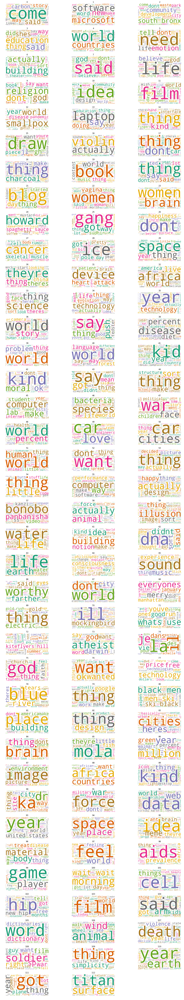

In [61]:
# Reset the output dimensions
import matplotlib.pyplot as plt

plt.rcParams['figure.figsize'] = [21, 300]


# Create subplots for 300 speeches
for speech_num in list(range(0,300)):
    wc.generate(data_clean.text[speech_num])
    
    plt.subplot(100, 3, speech_num+1)
    plt.imshow(wc, interpolation="bilinear")
    plt.axis("off")
    plt.title(speech_num)
    
plt.show()

In [62]:
data_clean.text[113]

'            '

In [67]:
pd.set_option('max_colwidth',800)
data_clean.iloc[111:114]

,text
111,i am known best for humanpowered flight but that was just one thing that got me going in the sort of things that im working in now as a youngster i was very interested in model airplanes ornithopters autogyros helicopters gliders power planes indoor models outdoor models everything which i just thought was a lot of fun and wondered why most other people didnt share my same enthusiasm with them and then navy pilot training and after college i got into sailplane flying power plane flying and considered the sailplanes as a sort of hobby and fun but got tangled up with some great professor types who convinced me and everybody else in the field that this was a good way to get into really deep science while this was all going on i was in the field of weather modification although gettin...
112,in the next minutes im going to take you on a journey and its a journey that you and i have been on for many years now and it began some years ago when humans first stepped off our planet and in those years not only did we literally physically set foot on the moon but we have dispatched robotic spacecraft to all the planets all eight of them and we have landed on asteroids we have rendezvoused with comets and at this point in time we have a spacecraft on its way to pluto the body formerly known as a planet and all of these robotic missions are part of a bigger human journey a voyage to understand something to get a sense of our cosmic place to understand something of our origins and how earth our planet and we living on it came to be and of all the places in the solar system ...
113,


In [76]:
pd.reset_option('max_colwidth')
df.iloc[112:115]

,Talk_ID,public_url,headline,description,event,duration,published,tags,views,text,...,speaker2_introduction,speaker2_profile,speaker_3,speaker3_occupation,speaker3_introduction,speaker3_profile,speaker_4,speaker4_occupation,speaker4_introduction,speaker4_profile
112,178,https://www.ted.com/talks/carolyn_porco_flies_...,This is Saturn,Planetary scientist Carolyn Porco shows images...,TED2007,0:17:09,10/1/07,"Planets,solar system,NASA,visualizations,explo...",2711956,"In the next 18 minutes, I'm going to take yo...",...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
113,179,https://www.ted.com/talks/kenichi_ebina_s_magi...,My magic moves,Kenichi Ebina moves his body in a manner that ...,TED2007,0:03:32,10/3/07,"entertainment,culture,dance,performance",1763082,(Applause) (Music) (Applause),...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
114,181,https://www.ted.com/talks/richard_branson_s_li...,"Life at 30,000 feet",Richard Branson talks to TED's Chris Anderson ...,TED2007,0:29:51,10/9/07,"entertainment,interview,global issues,aircraft...",1659113,Chris Anderson: Welcome to TED. Richard B...,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN


In [77]:
df.text.iloc[113]

'  (Applause)    (Music)    (Applause)  '

In [105]:
df.iloc[50:60]

,Talk_ID,public_url,headline,description,event,duration,published,views,text,speaker_1,...,speaker2_profile,speaker_3,speaker3_occupation,speaker3_introduction,speaker3_profile,speaker_4,speaker4_occupation,speaker4_introduction,speaker4_profile,tag
50,96,https://www.ted.com/talks/tony_robbins_asks_wh...,Why we do what we do,"Tony Robbins discusses the ""invisible forces"" ...",TED2006,0:21:45,6/27/06,22368699,Thank you. I have to tell you I'm both chall...,Tony Robbins,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,emotions
51,96,https://www.ted.com/talks/tony_robbins_asks_wh...,Why we do what we do,"Tony Robbins discusses the ""invisible forces"" ...",TED2006,0:21:45,6/27/06,22368699,Thank you. I have to tell you I'm both chall...,Tony Robbins,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,culture
52,96,https://www.ted.com/talks/tony_robbins_asks_wh...,Why we do what we do,"Tony Robbins discusses the ""invisible forces"" ...",TED2006,0:21:45,6/27/06,22368699,Thank you. I have to tell you I'm both chall...,Tony Robbins,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,business
53,49,https://www.ted.com/talks/joshua_prince_ramus_...,Behind the design of Seattle's library,Architect Joshua Prince-Ramus takes the audien...,TED2006,0:19:58,7/10/06,1042335,I'm going to present three projects in rapid...,Joshua Prince-Ramus,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,library
54,49,https://www.ted.com/talks/joshua_prince_ramus_...,Behind the design of Seattle's library,Architect Joshua Prince-Ramus takes the audien...,TED2006,0:19:58,7/10/06,1042335,I'm going to present three projects in rapid...,Joshua Prince-Ramus,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,architecture
55,49,https://www.ted.com/talks/joshua_prince_ramus_...,Behind the design of Seattle's library,Architect Joshua Prince-Ramus takes the audien...,TED2006,0:19:58,7/10/06,1042335,I'm going to present three projects in rapid...,Joshua Prince-Ramus,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,design
56,49,https://www.ted.com/talks/joshua_prince_ramus_...,Behind the design of Seattle's library,Architect Joshua Prince-Ramus takes the audien...,TED2006,0:19:58,7/10/06,1042335,I'm going to present three projects in rapid...,Joshua Prince-Ramus,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,culture
57,49,https://www.ted.com/talks/joshua_prince_ramus_...,Behind the design of Seattle's library,Architect Joshua Prince-Ramus takes the audien...,TED2006,0:19:58,7/10/06,1042335,I'm going to present three projects in rapid...,Joshua Prince-Ramus,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,collaboration
58,86,https://www.ted.com/talks/julia_sweeney_on_let...,Letting go of God,When two young Mormon missionaries knock on Ju...,TED2006,0:16:32,7/10/06,3903747,"On September 10, the morning of my seventh b...",Julia Sweeney,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,atheism
59,86,https://www.ted.com/talks/julia_sweeney_on_let...,Letting go of God,When two young Mormon missionaries knock on Ju...,TED2006,0:16:32,7/10/06,3903747,"On September 10, the morning of my seventh b...",Julia Sweeney,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,Christianity


#### JBL

In [ ]:
#split based on words only
words = re.split(r'\W+', df.text)

In [ ]:
# split into words
from nltk.tokenize import word_tokenize
tokens = word_tokenize(text)
# convert to lower case
tokens = [w.lower() for w in tokens]
# remove punctuation from each word
import string
table = str.maketrans('', '', string.punctuation)
stripped = [w.translate(table) for w in tokens]
# remove remaining tokens that are not alphabetic
words = [word for word in stripped if word.isalpha()]
# filter out stop words
from nltk.corpus import stopwords
stop_words = set(stopwords.words('english'))
words = [w for w in words if not w in stop_words]
print(words[:100])

#### DJ

In [97]:
from nltk.tokenize.toktok import ToktokTokenizer
from contractions import CONTRACTION_MAP
import unicodedata

nlp = spacy.load('en', parse = True, tag=True, entity=True)
# nlp_vec = spacy.load('en_vecs', parse = True, tag=True, entity=True)
tokenizer = ToktokTokenizer()
stopword_list = nltk.corpus.stopwords.words('english')
stopword_list.remove('no')
stopword_list.remove('not')

In [98]:
def remove_accented_chars(text):
    text = unicodedata.normalize('NFKD', text).encode('ascii', 'ignore').decode('utf-8', 'ignore')
    return text

remove_accented_chars('Sómě Áccěntěd těxt')

'Some Accented text'

In [99]:
def expand_contractions(text, contraction_mapping=CONTRACTION_MAP):
    
    contractions_pattern = re.compile('({})'.format('|'.join(contraction_mapping.keys())), 
                                      flags=re.IGNORECASE|re.DOTALL)
#    print('^^', contractions_pattern, '^^') # Jay: remove after testing
    
    def expand_match(contraction):
        match = contraction.group(0)
        first_char = match[0]
        expanded_contraction = contraction_mapping.get(match)\
                                if contraction_mapping.get(match)\
                                else contraction_mapping.get(match.lower())                       
        expanded_contraction = first_char+expanded_contraction[1:]
        return expanded_contraction
        
    expanded_text = contractions_pattern.sub(expand_match, text)
    expanded_text = re.sub("'", "", expanded_text)
    return expanded_text

expand_contractions("Y'all can't expand contractions I'd think")

'You all cannot expand contractions I would think'

In [100]:
def remove_special_characters(text, remove_digits=False):
    pattern = r'[^a-zA-z0-9\s]' if not remove_digits else r'[^a-zA-z\s]'
    text = re.sub(pattern, '', text)
    return text

remove_special_characters("Well this was fun! What do you think? 123#@!", 
                          remove_digits=True)

'Well this was fun What do you think '

In [101]:
def lemmatize_text(text):
    text = nlp(text)
    text = ' '.join([word.lemma_ if word.lemma_ != '-PRON-' else word.text for word in text])
    return text

lemmatize_text("My system keeps crashing! his crashed yesterday, ours crashes daily")

'My system keep crash ! his crash yesterday , ours crash daily'

In [102]:
def remove_stopwords(text, is_lower_case=False):
    tokens = tokenizer.tokenize(text)
    tokens = [token.strip() for token in tokens]
    if is_lower_case:
        filtered_tokens = [token for token in tokens if token not in stopword_list]
    else:
        filtered_tokens = [token for token in tokens if token.lower() not in stopword_list]
    filtered_text = ' '.join(filtered_tokens)    
    return filtered_text

remove_stopwords("The, and, if are stopwords, computer is not")

', , stopwords , computer not'

In [103]:
def normalize_corpus(corpus, html_stripping=True, contraction_expansion=True,
                     accented_char_removal=True, text_lower_case=True, 
                     text_lemmatization=True, special_char_removal=True, 
                     stopword_removal=True, remove_digits=True):
    
    normalized_corpus = []
    # normalize each document in the corpus
    for doc in corpus:
        # strip HTML
        if html_stripping:
            doc = strip_html_tags(doc)
        # remove accented characters
        if accented_char_removal:
            doc = remove_accented_chars(doc)
        # expand contractions    
        if contraction_expansion:
            doc = expand_contractions(doc)
        # lowercase the text    
        if text_lower_case:
            doc = doc.lower()
        # remove extra newlines
        doc = re.sub(r'[\r|\n|\r\n]+', ' ',doc)
        # lemmatize text
        if text_lemmatization:
            doc = lemmatize_text(doc)
        # remove special characters and\or digits    
        if special_char_removal:
            # insert spaces between special characters to isolate them    
            special_char_pattern = re.compile(r'([{.(-)!}])')
            doc = special_char_pattern.sub(" \\1 ", doc)
            doc = remove_special_characters(doc, remove_digits=remove_digits)  
        # remove extra whitespace
        doc = re.sub(' +', ' ', doc)
        # remove stopwords
        if stopword_removal:
            doc = remove_stopwords(doc, is_lower_case=text_lower_case)
            
        normalized_corpus.append(doc)
        
    return normalized_corpus

In [ ]:
df['clean_text'] = normalize_corpus(df['text'])
norm_corpus = list(df['clean_text'])
df.iloc[1][['text', 'clean_text']].to_dict()

#### Eman

In [ ]:
# eman.prep
from nltk.tokenize import RegexpTokenizer

def standardize_text(df, text_field):
    df[text_field] = df[text_field].str.replace(r"http\S+", "")
    df[text_field] = df[text_field].str.replace(r"http", "")
    df[text_field] = df[text_field].str.replace(r"@\S+", "")
    df[text_field] = df[text_field].str.replace(r"[^A-Za-z0-9(),!?@\'\`\"\_\n]", " ")
    df[text_field] = df[text_field].str.replace(r"@", "at")
    df[text_field] = df[text_field].str.lower()
    return df

clean_speech_eman = standardize_text(questions, "text")
#clean_speech_eman.to_csv("clean_speech_eman.csv")
# clean_questions = pd.read_csv("clean_speech_eman.csv")
# clean_speech_eman.sample(15)

tokenizer = RegexpTokenizer(r'\w+')

clean_questions["tokens"] = clean_questions["text"].apply(tokenizer.tokenize)
clean_questions.head()

#### RK

In [83]:
from nltk.corpus import stopwords
from nltk.tokenize import RegexpTokenizer
from nltk.stem import WordNetLemmatizer
from nltk.stem.porter import PorterStemmer

In [81]:
# remove punctuation
def remove_punctuation(text):
    no_punct = "".join([c for c in text in c not in string.punctuation])
    return no_punct
df['text'] = df['text'].apply(lambda x: remove_punctuation)

#tokenize
tokenizer = RegexpTokenizer(r'\w+')
df['text'] = df['text'].apply(lambda x: tokenizer.tokenize(x.lower()))
                            
def remove_stopwords(text):
    words = [w for w in text if w not in stopwords.words('english')]
    return words                            
df['text'] = df['text'].apply(lambda x: remove_stopwords(x))

# lemmatize
lemmatizer = WordNetLemmatizer()
def word_lemmatizer(text):
    lem_text = [lemmatizer.lemmatize(i) for i in text]
    return lem_text
df['text'] = df['text'].apply(lambda x: word_lemmatizer(x))

NameError: name 'RegexpTokenizer' is not defined

In [ ]:
from mpl_toolkits.mplot3d import Axes3D
import matplotlib.pyplot as plt
%matplotlib inline
from sklearn.manifold import TSNE
from nltk.tokenize import word_tokenize
np.random.seed(0)

### Leave Pre-Processing World (for now...)

In [ ]:
# from Hamilton's slack (LDA visuals)
import matplotlib.pyplot as plt
for t in range(ldamodel.num_topics):
    plt.figure()
    plt.imshow(WordCloud().fit_words(dict(ldamodel.show_topic(t, 200))))
    plt.axis("off")
    plt.title("Topic #" + str(t))
    plt.show()

### Explode the list of tags

In [106]:
# reset index from Talk_ID to generic array
# df.reset_index(inplace=True)
pd.reset_option('max_colwidth')
pre_expl_df = nomusic_df.reset_index()
pre_expl_df.sample(16)

,Talk_ID,public_url,headline,description,event,duration,published,tags,views,text,...,speaker2_profile,speaker_3,speaker3_occupation,speaker3_introduction,speaker3_profile,speaker_4,speaker4_occupation,speaker4_introduction,speaker4_profile,speech_length
404,1107,https://www.ted.com/talks/ralph_langner_cracki...,"Cracking Stuxnet, a 21st-century cyber weapon","When first discovered in 2010, the Stuxnet com...",TED2011,0:10:40,3/29/11,"Iran,nuclear energy,war,government,computers,s...",1394574,The idea behind the Stuxnet computer worm is...,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,8664
752,2475,https://www.ted.com/talks/parag_khanna_how_meg...,How megacities are changing the map of the world,"""I want you to reimagine how life is organized...",TED2016,0:20:34,4/5/16,"policy,war,big problems,map,transportation,wor...",1002607,I want you to reimagine how life is organize...,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,17000
265,503,https://www.ted.com/talks/christopher_deam_res...,"The Airstream, restyled","In this low-key, image-packed talk from 2002, ...",TED2002,0:06:21,4/2/09,"transportation,exploration,design,creativity,m...",314011,"I was asked by Wilsonart International, a pl...",...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,5236
201,365,https://www.ted.com/talks/jared_diamond_on_why...,Why do societies collapse?,Why do societies fail? With lessons from the N...,TED2003,0:18:21,10/27/08,"global issues,history,environment,culture,tech...",1883993,"I think all of us have been interested, at o...",...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,16737
1020,963,https://www.ted.com/talks/annie_lennox_why_i_a...,Why I am an HIV/AIDS activist,"For the last eight years, pop singer Annie Len...",TEDGlobal 2010,0:09:16,9/22/10,"AIDS,HIV,activism,health,Africa,personal growth",504104,I'm going to share with you the story as to ...,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,7543
990,791,https://www.ted.com/talks/ken_kamler_medical_m...,Medical miracle on Everest,The second deadliest day in the history of Mou...,TEDMED 2009,0:20:49,3/18/10,"adventure,exploration,weather,medicine,biology...",744706,OK. We've heard a lot of people speak at thi...,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,18514
1546,6493,https://www.ted.com/talks/deborah_willis_and_h...,A mother and son united by love and art,An art school professor once told Deborah Will...,TEDWomen 2017,0:10:34,12/20/17,"photography,family,art,history,politics,creati...",894087,Hank Willis Thomas: I'm Deb's son. (Laugh...,...,Why you should listen\nHank Willis Thomas's wo...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,9650
1102,1219,https://www.ted.com/talks/raghava_kk_shake_up_...,Shake up your story,Artist Raghava KK demos his new children's boo...,TEDGlobal 2011,0:04:30,9/9/11,"entertainment,books,storytelling,design,creati...",959507,Hi everyone. I'm an artist and a dad — secon...,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,3646
776,2516,https://www.ted.com/talks/norman_lear_an_enter...,An entertainment icon on living a life of meaning,"In the 1970s (and decades following), TV produ...",TED2016,0:19:46,6/2/16,"entertainment,interview,television,family,film...",1076052,Eric Hirshberg: So I assume that Norman does...,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,14709
58,113,https://www.ted.com/talks/richard_dawkins_on_m...,Militant atheism,Richard Dawkins urges all atheists to openly s...,TED2002,0:29:10,4/16/07,"atheism,religion,God,science,culture",4545599,"That splendid music, the coming-in music, ""T...",...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,23805


In [72]:
#df['tags']=df['tags'].str.split(',').tolist()

In [73]:
#df.tags.astype('list')
#df['tags'].sample(20)

Talk_ID
836     [engineering, microbiology, TED Fellows, biolo...
1895                                 [design, innovation]
885     [entertainment, online video, law, art, creati...
323     [anthropology, evolution, DNA, Africa, science...
2516    [entertainment, interview, television, family,...
1449               [fear, design, creativity, technology]
119     [entertainment, sports, live music, poetry, cu...
2103    [memory, sleep, history, health, neuroscience,...
2841    [product design, computers, intelligence, AI, ...
633     [narcotics, crime, journalism, global issues, ...
396     [entertainment, media, humor, design, creativi...
512     [alternative energy, cars, infrastructure, gre...
1744              [aging, death, life, culture, humanity]
39      [biotech, engineering, aging, health care, dis...
2024    [Middle East, TED Books, peace, terrorism, vio...
6379    [TED Fellows, design, product design, Africa, ...
421     [geology, Planets, extraterrestrial life, sola...
1835  

In [109]:
# (1) We start with creating a new dataframe from the series with Talk_Id as the index
exploding_df = pd.DataFrame(pre_expl_df.tags.str.split(',').tolist(), index=pre_expl_df.Talk_ID).stack()

In [110]:
exploding_df.head(20)

Talk_ID   
1        0    alternative energy
         1                  cars
         2         global issues
         3        climate change
         4           environment
         5               science
         6               culture
         7        sustainability
         8            technology
53       0       MacArthur grant
         1                cities
         2                 green
         3              activism
         4              politics
         5             pollution
         6           environment
         7            inequality
         8              business
66       0              children
         1              teaching
dtype: object

In [112]:
# (2) We now want to get rid of the secondary index. To do this, we will make EmployeeId
# as a column (it can't be an index since the values will be duplicate)
exploded_df = exploding_df.reset_index([0, 'Talk_ID'])

# (3) The final step is to set the column names as we want them
exploded_df.columns = ['Talk_ID', 'tag']

In [113]:
exploded_df.head(20)

,Talk_ID,tag
0,1,alternative energy
1,1,cars
2,1,global issues
3,1,climate change
4,1,environment
5,1,science
6,1,culture
7,1,sustainability
8,1,technology
9,53,MacArthur grant


In [114]:
df = pd.merge(df, exploded_df, on='Talk_ID')

In [136]:
# df.drop(['tags'], axis=1, inplace=True)

In [115]:
df.head(20)

,Talk_ID,public_url,headline,description,event,duration,published,tags,views,text,...,speaker_3,speaker3_occupation,speaker3_introduction,speaker3_profile,speaker_4,speaker4_occupation,speaker4_introduction,speaker4_profile,speech_length,tag
0,1,https://www.ted.com/talks/al_gore_on_averting_...,Averting the climate crisis,With the same humor and humanity he exuded in ...,TED2006,0:16:17,6/27/06,"alternative energy,cars,global issues,climate ...",3266733,"Thank you so much, Chris. And it's truly a g...",...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,12074,alternative energy
1,1,https://www.ted.com/talks/al_gore_on_averting_...,Averting the climate crisis,With the same humor and humanity he exuded in ...,TED2006,0:16:17,6/27/06,"alternative energy,cars,global issues,climate ...",3266733,"Thank you so much, Chris. And it's truly a g...",...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,12074,cars
2,1,https://www.ted.com/talks/al_gore_on_averting_...,Averting the climate crisis,With the same humor and humanity he exuded in ...,TED2006,0:16:17,6/27/06,"alternative energy,cars,global issues,climate ...",3266733,"Thank you so much, Chris. And it's truly a g...",...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,12074,global issues
3,1,https://www.ted.com/talks/al_gore_on_averting_...,Averting the climate crisis,With the same humor and humanity he exuded in ...,TED2006,0:16:17,6/27/06,"alternative energy,cars,global issues,climate ...",3266733,"Thank you so much, Chris. And it's truly a g...",...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,12074,climate change
4,1,https://www.ted.com/talks/al_gore_on_averting_...,Averting the climate crisis,With the same humor and humanity he exuded in ...,TED2006,0:16:17,6/27/06,"alternative energy,cars,global issues,climate ...",3266733,"Thank you so much, Chris. And it's truly a g...",...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,12074,environment
5,1,https://www.ted.com/talks/al_gore_on_averting_...,Averting the climate crisis,With the same humor and humanity he exuded in ...,TED2006,0:16:17,6/27/06,"alternative energy,cars,global issues,climate ...",3266733,"Thank you so much, Chris. And it's truly a g...",...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,12074,science
6,1,https://www.ted.com/talks/al_gore_on_averting_...,Averting the climate crisis,With the same humor and humanity he exuded in ...,TED2006,0:16:17,6/27/06,"alternative energy,cars,global issues,climate ...",3266733,"Thank you so much, Chris. And it's truly a g...",...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,12074,culture
7,1,https://www.ted.com/talks/al_gore_on_averting_...,Averting the climate crisis,With the same humor and humanity he exuded in ...,TED2006,0:16:17,6/27/06,"alternative energy,cars,global issues,climate ...",3266733,"Thank you so much, Chris. And it's truly a g...",...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,12074,sustainability
8,1,https://www.ted.com/talks/al_gore_on_averting_...,Averting the climate crisis,With the same humor and humanity he exuded in ...,TED2006,0:16:17,6/27/06,"alternative energy,cars,global issues,climate ...",3266733,"Thank you so much, Chris. And it's truly a g...",...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,12074,technology
9,53,https://www.ted.com/talks/majora_carter_s_tale...,Greening the ghetto,"In an emotionally charged talk, MacArthur-winn...",TED2006,0:18:36,6/27/06,"MacArthur grant,cities,green,activism,politics...",2000421,If you're here today — and I'm very happy th...,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,18477,MacArthur grant


In [113]:
# Save & Store File (Pickle)

# filename = "exploded1"
# outfile = open(filename, 'wb')
# pickle.dump(df, outfile)
# outfile.close()

In [13]:
# Retrieve File (Un-pickle)
filename = 'exploded1'
infile = open(filename,'rb')
new_file = pickle.load(infile)
infile.close()

In [14]:
df = new_file

In [15]:
### ALL TAGS ###
df['tag'].value_counts()

technology        535
science           409
culture           352
global issues     341
design            300
business          232
entertainment     214
social change     182
society           178
art               165
health            154
innovation        150
creativity        149
future            148
humanity          140
TED Fellows       136
communication     132
biology           132
activism          126
collaboration     124
medicine          122
economics         113
Africa            112
brain             111
community         110
invention         108
environment       104
education          98
history            97
health care        96
                 ... 
microfinance        3
trafficking         2
monkeys             2
state-building      2
jazz                2
urban               2
origami             2
epidemiology        2
cello               2
evil                2
Nobel Prize         2
Brand               2
homelessness        2
funny               2
PTSD      

In [20]:
df.tag.unique()

array(['alternative energy', 'cars', 'global issues', 'climate change',
       'environment', 'science', 'culture', 'sustainability',
       'technology', 'simplicity', 'entertainment', 'interface design',
       'software', 'media', 'computers', 'music', 'performance',
       'MacArthur grant', 'cities', 'green', 'activism', 'politics',
       'pollution', 'inequality', 'business', 'children', 'teaching',
       'creativity', 'parenting', 'dance', 'education', 'demo', 'Asia',
       'visualizations', 'global development', 'statistics', 'math',
       'health', 'economics', 'Google', 'Africa', 'goal-setting',
       'potential', 'psychology', 'motivation', 'emotions', 'library',
       'architecture', 'design', 'collaboration', 'atheism',
       'Christianity', 'religion', 'God', 'comedy', 'humor',
       'storytelling', 'philanthropy', 'happiness', 'leadership',
       'consciousness', 'evolution', 'philosophy', 'cognitive science',
       'brain', 'disaster relief', 'open-source', 'i

In [90]:
pd.set_option('max_colwidth',1000)
df.text[df.tag == 'dance'].sample(20)

AttributeError: 'DataFrame' object has no attribute 'tag'

In [160]:
# filter to only tags that are used at least 90 times
df_filtered = df.groupby('tag').filter(lambda x: len(x) >= 90)

In [162]:
# df_filtered.info()
pd.reset_option('max_colwidth')
df_filtered.sample(20)

,Talk_ID,public_url,headline,description,event,duration,published,views,text,speaker_1,...,speaker2_profile,speaker_3,speaker3_occupation,speaker3_introduction,speaker3_profile,speaker_4,speaker4_occupation,speaker4_introduction,speaker4_profile,tag
3452,1374,https://www.ted.com/talks/paul_gilding_the_ear...,The Earth is full,Have we used up all our resources? Have we fil...,TED2012,0:16:46,2/29/12,1216775,Let me begin with four words that will provi...,Paul Gilding,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,activism
41,92,https://www.ted.com/talks/hans_rosling_shows_t...,The best stats you've ever seen,You've never seen data presented like this. Wi...,TED2006,0:19:50,6/27/06,12662135,"About 10 years ago, I took on the task to te...",Hans Rosling,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,health
9223,1513,https://www.ted.com/talks/james_stavridis_how_...,A Navy Admiral's thoughts on global security,Imagine global security driven by collaboratio...,TEDGlobal 2012,0:16:43,7/23/12,732883,I'm gonna talk a little bit about open-sourc...,James Stavridis,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,global issues
7877,706,https://www.ted.com/talks/rory_bremner_s_one_m...,A one-man world summit,Scottish funnyman Rory Bremner convenes a hist...,TEDGlobal 2009,0:14:41,12/7/09,1140041,Chris has been so nice. I don't know how you...,Rory Bremner,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,politics
13062,10274,https://www.ted.com/talks/isabel_wilkerson_the...,The Great Migration and the power of a single ...,"Sometimes, a single decision can change the co...",TEDWomen 2017,0:17:55,3/15/18,833416,Imagine with me this scene. It's a scene tha...,Isabel Wilkerson,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,history
1436,300,https://www.ted.com/talks/torsten_reil_studies...,Animate characters by evolving them,Torsten Reil talks about how the study of biol...,TED2003,0:18:20,7/8/08,332538,I'm going to talk about a technology that we...,Torsten Reil,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,technology
8648,1219,https://www.ted.com/talks/raghava_kk_shake_up_...,Shake up your story,Artist Raghava KK demos his new children's boo...,TEDGlobal 2011,0:04:30,9/9/11,959507,Hi everyone. I'm an artist and a dad — secon...,Raghava KK,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,design
3180,1131,https://www.ted.com/talks/harvey_fineberg_are_...,Are we ready for neo-evolution?,Medical ethicist Harvey Fineberg shows us thre...,TED2011,0:17:21,4/25/11,1036830,How would you like to be better than you are...,Harvey Fineberg,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,medicine
3336,1180,https://www.ted.com/talks/rajesh_rao_computing...,A Rosetta Stone for a lost language,"Rajesh Rao is fascinated by ""the mother of all...",TED2011,0:17:01,6/28/11,1235978,I'd like to begin with a thought experiment....,Rajesh Rao,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,history
6861,2882,https://www.ted.com/talks/karoliina_korppoo_ho...,How a video game might help us build better ci...,With more than half of the world population li...,TED2017,0:08:39,9/22/17,1318166,"We humans are becoming an urban species, so ...",Karoliina Korppoo,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,society


In [147]:
df_filtered.tag.value_counts()

technology       535
science          409
culture          352
global issues    341
design           300
business         232
entertainment    214
social change    182
society          178
art              165
health           154
innovation       150
creativity       149
future           148
humanity         140
TED Fellows      136
communication    132
biology          132
activism         126
collaboration    124
medicine         122
economics        113
Africa           112
brain            111
community        110
invention        108
environment      104
education         98
history           97
health care       96
music             95
politics          90
Name: tag, dtype: int64